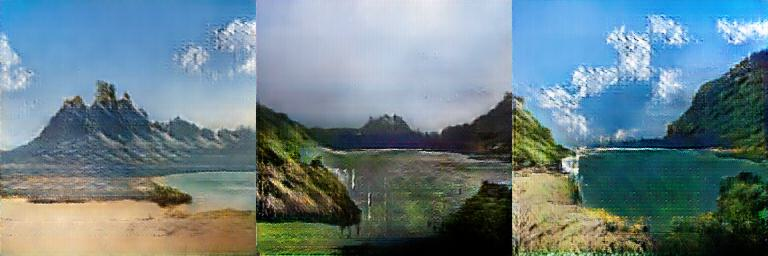

# Generating Landscapes Using DCGAN

## Understanding DCGAN and Adversarial Training

### What is DCGAN?
DCGAN (Deep Convolutional Generative Adversarial Network) is a type of GAN that uses deep convolutional layers in its two main components: the generator and the discriminator.

- **Generator**:  
  A neural network that generates images from random noise. It uses transposed convolutional layers to upsample the noise into meaningful patterns.

- **Discriminator**:  
  A neural network that evaluates whether input data is real (from the dataset) or fake (generated by the generator). It employs convolutional layers to extract features and distinguish between real and synthetic data.

These two networks are trained **adversarially**: the generator tries to produce data that looks real, while the discriminator tries to correctly identify whether data is real or fake. This competitive dynamic improves both networks over time, enabling the generator to produce increasingly realistic data.

---

### Adversarial Training Process

Adversarial training involves alternating updates to the generator and discriminator based on their respective losses:

- **Discriminator Loss**:  
  $$ \text{Loss}_D = -\mathbb{E}[\log(D(\text{real data}))] - \mathbb{E}[\log(1 - D(\text{fake data}))] $$  
  This measures how well the discriminator separates real data from fake data.

- **Generator Loss**:  
  $$ \text{Loss}_G = -\mathbb{E}[\log(D(\text{fake data}))] $$  
  This measures how well the generator fools the discriminator into believing fake data is real.

---

### Illustration of Adversarial Training with Numbers

### Discriminator Training

The discriminator calculates its loss by evaluating real and fake data separately:

#### Real Data
The discriminator evaluates 10 real images and assigns probabilities of being real:  \[0.85, 0.88, 0.9, 0.78, 0.8, 0.82, 0.84, 0.9, 0.86, 0.87\]  

The **average predicted probability** for real data is:  
$$ \text{Avg}(D(\text{real data})) = \frac{0.85 + 0.88 + \dots + 0.87}{10} = 0.85 $$  

The contribution to the loss from real data is:  
$$ -\log(0.85) \approx 0.162 $$  

#### Fake Data
The generator creates 10 fake images, and the discriminator assigns probabilities of being real:  \[0.2, 0.3, 0.25, 0.35, 0.4, 0.2, 0.3, 0.15, 0.25, 0.3\]  

The **average predicted probability** for fake data is:  
$$ \text{Avg}(D(\text{fake data})) = \frac{0.2 + 0.3 + \dots + 0.3}{10} = 0.265 $$  

The contribution to the loss from fake data is:  
$$ -\log(1 - 0.265) = -\log(0.735) \approx 0.138 $$  

#### Total Discriminator Loss
Adding the contributions from real and fake data:  
$$ \text{Loss}_D = 0.162 + 0.138 = 0.300 $$  

The discriminator updates its parameters to minimize this loss, improving its ability to classify real and fake data.

---

### Generator Training

The generator attempts to fool the discriminator by improving the quality of its generated data:

The generator creates another set of fake images, and the discriminator assigns probabilities of realness:  \[0.45, 0.5, 0.55, 0.6, 0.4, 0.5, 0.52, 0.58, 0.46, 0.53\]  

The **average predicted probability** for these fake images is:  
$$ \text{Avg}(D(\text{fake data})) = \frac{0.45 + 0.5 + \dots + 0.53}{10} = 0.509 $$  

The generator’s loss is calculated as:  
$$ \text{Loss}_G = -\log(0.509) \approx 0.675 $$  

The generator updates its parameters to reduce this loss, improving its ability to produce realistic outputs.

---

### Continuous Improvement
This adversarial process continues:
- The **discriminator** becomes better at distinguishing real data from fake.
- The **generator** produces more realistic data over time to fool the discriminator.

Over time, this process enables the generator to produce highly realistic outputs, achieving the goal of DCGAN.

## 1. Load Libraries, Import Landscape Dataset, and Display an Image Grid

In [1]:
import os
import random
import torch
import torchvision
import numpy as np
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
import torch.optim as optim
from easydict import EasyDict
import torch.nn.functional as F
import matplotlib.pyplot as plt
from IPython.display import HTML
import torchvision.utils as vutils
import matplotlib.animation as animation
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn.utils.spectral_norm as spectral_norm

In [2]:
args = EasyDict({
    'dataset_path': r'<path_to_your_dataset',             # Path to the dataset.
    'save_dir': r'<path_to_your_saving_directory',        # Directory to save the best model.
    'save_epoch': 50,                                     # Save the model every 50 epochs.
    'img_res': 256,                                       # Image resolution for input data.
    'batch_size': 16,                                     # Number of samples per batch.
    'device': 'cuda',                                     # Device for computation (e.g., CUDA or CPU).
    'num_workers': 0,                                     # Number of data loader workers.
    'epochs': 150,                                        # Total number of training epochs.
    'd_lr': 0.00004,                                      # Learning rate for the discriminator.
    'g_lr': 0.0005,                                       # Learning rate for the generator.
    'beta1': 0.5,                                         # Beta1 hyperparameter for Adam optimizer.
    'beta2': 0.999,                                       # Beta2 hyperparameter for Adam optimizer.
    'noise_dim': 100,                                     # Dimensionality of input noise vector.
    'random_seed': 42,                                    # Seed for reproducibility.
    'mean': [0.5, 0.5, 0.5],                              # Mean for data normalization.
    'std': [0.5, 0.5, 0.5]                                # Standard deviation for data normalization.
})

In [3]:
# Define the Custom Dataset
class CustomImageDataset(Dataset):
    def __init__(self, root_dir, transform=None, image_num=4000):
        # Collects image file paths from the root directory, limited to `image_num` images.
        self.image_paths = sorted(
            [os.path.join(root_dir, fname) for fname in os.listdir(root_dir)
             if fname.lower().endswith(('.png', '.jpg', '.jpeg'))]
        )[:image_num]  # Limit to the first `image_num` images
        self.transform = transform # Transformation to apply to images

    def __len__(self):
        # Returns the number of images in the dataset.
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Loads an image by index, converts it to RGB, and applies transformations if provided.
        image = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        # Since no actual labels, return 0 as dummy labels
        return image, 0

    def set_transform(self, transform):
        # Allows dynamic updating of transformations after dataset initialization.
        self.transform = transform

# Transformation pipeline for data augmentation and normalization
transform = transforms.Compose([
    transforms.Resize((args.img_res)),
    # Randomly applies a horizontal flip with 40% probability.
    # transforms.CenterCrop(args.img_res),
    transforms.RandomApply([
        transforms.RandomHorizontalFlip(),
    ], p=0.4),  
    transforms.ToTensor(), # Converts image to a PyTorch tensor.
    transforms.Normalize((args.mean), (args.std)), # Normalizes using mean and std
])

In [4]:
# Create the dataset and DataLoader
dataset = CustomImageDataset(
    root_dir=args.dataset_path,  # Path to the dataset.
    transform=transform,         # Apply the defined transformations.
    image_num=4000               # Limit to 4000 images.
)
dataloader = DataLoader(
    dataset,
    batch_size=args.batch_size,  # Number of samples per batch.
    shuffle=True,                # Shuffle data for training.
    num_workers=args.num_workers # Number of worker threads for loading data.
)

# Test to check the batch shape
for i, (images, labels) in enumerate(dataloader):
    print(f"Batch {i + 1} shape: {images.shape}, Labels: {labels.shape}")
    break  # Print the shape of the first batch and labels

Batch 1 shape: torch.Size([16, 3, 256, 256]), Labels: torch.Size([16])


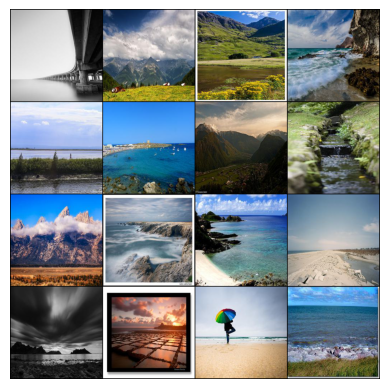

In [5]:
# Function to display an image grid
def imshow(img):
    img = img.numpy().transpose((1, 2, 0))  # Convert tensor format (C, H, W) to image format (H, W, C).
    # Normalize the image data to [0, 1] for display
    img = (img - img.min()) / (img.max() - img.min())
    plt.imshow(img)
    plt.axis('off')  
    plt.show()

# Retrieve a batch of images from the DataLoader
dataiter = iter(dataloader)
images, _ = next(dataiter) # Unpack the tuple to get images

# Ensure args.mean and args.std are tensors and reshape them for de-normalization.
mean = torch.tensor(args.mean).view(3, 1, 1)
std = torch.tensor(args.std).view(3, 1, 1)

# Ensure correct device match for de-normalization.
if images.device != mean.device:
    mean = mean.to(images.device)
    std = std.to(images.device)

# De-normalize images for visualization
images_denorm = images * std + mean

# Create and display a grid of de-normalized images.
img_grid = torchvision.utils.make_grid(images_denorm, nrow=4)  
imshow(img_grid)

In [6]:
# Verify that pixel values are within the range of -1 to 1.
min_pixel_value = images.min().item()
max_pixel_value = images.max().item()

print(f"Range of pixel intensities in the images: [{min_pixel_value}, {max_pixel_value}]")

Range of pixel intensities in the images: [-1.0, 1.0]


## 2. Discriminator and Generator Development

In [7]:
# Discriminator Architecture
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: 256x256 RGB image
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),  # 256x256 -> 128x128
            nn.LeakyReLU(0.2, inplace=True),

            # Downsample to 64x64
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # 128x128 -> 64x64
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            # Downsample to 32x32
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 64x64 -> 32x32
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # Downsample to 16x16
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 32x32 -> 16x16
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # Downsample to 8x8
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # 16x16 -> 8x8
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            # Flatten to a single scalar
            nn.Flatten(),
            nn.Linear(8*8*512, 1), # [32768,1]
            nn.Sigmoid()  # Output in range [0, 1]
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Generator Architecture
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # The noise vector introduces randomness, allowing the generator to produce diverse images.
            # Without it, the generator would always produce the same image due to a lack of input variation.
            # Transform the noise vector (100-dimensional in this case) into a 16384-dimensional feature vector (4x4x1024).
            nn.Linear(args.noise_dim, 4*4*1024),  
            nn.BatchNorm1d(4*4*1024),
            nn.ReLU(True),

            # Reshape the feature vector into [batch, channels, height, width] for further processing
            nn.Unflatten(1, (1024, 4, 4)),

            # Upsample to 8x8
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),  # 4x4 -> 8x8
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            # Upsample to 16x16
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # 8x8 -> 16x16
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            # Upsample to 32x32
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 16x16 -> 32x32
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # Upsample to 64x64
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 32x32 -> 64x64
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # Upsample to 128x128
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),  # 64x64 -> 128x128
            nn.BatchNorm2d(32),
            nn.ReLU(True),

            # Upsample to 256x256
            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),  # 128x128 -> 256x256
            nn.Tanh()  # Output image in range [-1, 1]
        )

    def forward(self, input):
        # Flattens the 4D input tensor to a 2D shape (batch_size, noise_dim) to match the expected input shape of the first layer (nn.Linear).
        input = input.view(input.size(0), -1)  # Reshape (batch_size, noise_dim, 1, 1) to (batch_size, noise_dim)
        return self.main(input)


In [9]:
# Weights Initialization
def weights_init(m):
    classname = m.__class__.__name__
    # Check if the layer is a convolutional layer
    if classname.find('Conv') != -1:
        # Initialize weights for Conv2d and ConvTranspose2d layers
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        
    # Check if the layer is a batch normalization layer
    elif classname.find('BatchNorm') != -1:
        # Initialize weights for BatchNorm layers
        nn.init.normal_(m.weight.data, 1.0, 0.02) # Normal distribution (mean=1.0, std=0.02)
        nn.init.constant_(m.bias.data, 0)         # Biases set to 0.0

## 3. Model Initialization and Training Setup

In [10]:
# Initialize the Discriminator
d_net = Discriminator().to(args.device)

# Apply the weights_init to randomly initialize all weights
d_net.apply(weights_init)

# Print the model
print(d_net)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): 

In [11]:
# Initialize the Generator
g_net = Generator().to(args.device)

# Apply the weights_init to randomly initialize all weights
g_net.apply(weights_init)

# Print the model
print(g_net)

Generator(
  (main): Sequential(
    (0): Linear(in_features=100, out_features=16384, bias=True)
    (1): BatchNorm1d(16384, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Unflatten(dim=1, unflattened_size=(1024, 4, 4))
    (4): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (14): BatchNorm2d(64

In [12]:
# Binary Cross-Entropy Loss function
criterion = nn.BCELoss()

# Ensure the directory for saving the best generator model exists, create it if necessary
os.makedirs(args.save_dir, exist_ok=True) 

# Lists to store the losses for plotting 
avg_D_losses = [] # Average Discriminator's loss 
avg_G_losses = [] # Avergae Generator's loss 

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
d_optimizer = optim.Adam(d_net.parameters(), lr=args.d_lr, betas=(args.beta1, args.beta2))
g_optimizer = optim.Adam(g_net.parameters(), lr=args.g_lr, betas=(args.beta1, args.beta2))

## 4. Training Loop & Visualization

In [13]:
# Unnormalize the input image (convert pixel range from [-1, 1] to [0, 1]), 
# convert it to a NumPy array, rearrange dimensions for correct display, and visualize it.
def imshow(img):
    img = img / 2 + 0.5 
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    
# Plot and visualize the training losses for the generator and discriminator 
def plot_results():
    plt.figure(figsize=(10, 5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(avg_G_losses, label="Generator Loss")
    plt.plot(avg_D_losses, label="Discriminator Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Epoch 1/150, Avg Discriminator Loss: 4.3883, Avg Generator Loss: 0.6277
D(x): 0.4053, D(G(z1))/D(G(z2)): 0.5838 / 0.3726


Epoch 2/150, Avg Discriminator Loss: 1.7494, Avg Generator Loss: 0.8438
D(x): 0.3997, D(G(z1))/D(G(z2)): 0.6812 / 0.6447


Epoch 3/150, Avg Discriminator Loss: 1.6895, Avg Generator Loss: 0.6115
D(x): 0.4219, D(G(z1))/D(G(z2)): 0.4744 / 0.4630


Epoch 4/150, Avg Discriminator Loss: 1.5545, Avg Generator Loss: 0.6804
D(x): 0.5615, D(G(z1))/D(G(z2)): 0.5507 / 0.5033


Epoch 5/150, Avg Discriminator Loss: 1.4976, Avg Generator Loss: 0.7305
D(x): 0.4352, D(G(z1))/D(G(z2)): 0.4784 / 0.4636


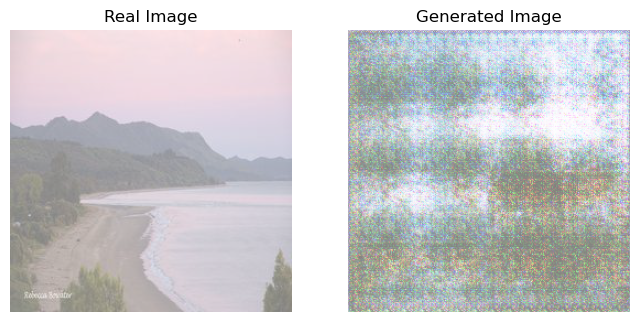

Epoch 6/150, Avg Discriminator Loss: 1.4968, Avg Generator Loss: 0.6934
D(x): 0.5280, D(G(z1))/D(G(z2)): 0.5339 / 0.5161


Epoch 7/150, Avg Discriminator Loss: 1.4923, Avg Generator Loss: 0.7022
D(x): 0.5084, D(G(z1))/D(G(z2)): 0.5234 / 0.5193


Epoch 8/150, Avg Discriminator Loss: 1.4705, Avg Generator Loss: 0.7294
D(x): 0.4314, D(G(z1))/D(G(z2)): 0.4798 / 0.4183


Epoch 9/150, Avg Discriminator Loss: 1.4509, Avg Generator Loss: 0.7073
D(x): 0.5126, D(G(z1))/D(G(z2)): 0.5284 / 0.5262


Epoch 10/150, Avg Discriminator Loss: 1.4465, Avg Generator Loss: 0.7215
D(x): 0.4700, D(G(z1))/D(G(z2)): 0.5237 / 0.5347


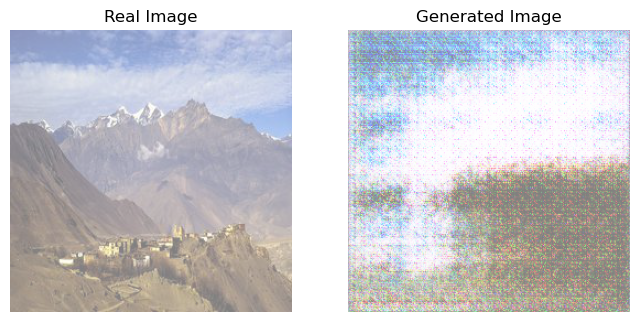

Epoch 11/150, Avg Discriminator Loss: 1.4418, Avg Generator Loss: 0.7365
D(x): 0.4808, D(G(z1))/D(G(z2)): 0.4742 / 0.4509


Epoch 12/150, Avg Discriminator Loss: 1.4395, Avg Generator Loss: 0.7380
D(x): 0.4678, D(G(z1))/D(G(z2)): 0.5113 / 0.5014


Epoch 13/150, Avg Discriminator Loss: 1.4268, Avg Generator Loss: 0.7205
D(x): 0.5100, D(G(z1))/D(G(z2)): 0.5123 / 0.4895


Epoch 14/150, Avg Discriminator Loss: 1.4322, Avg Generator Loss: 0.7406
D(x): 0.4772, D(G(z1))/D(G(z2)): 0.5067 / 0.4783


Epoch 15/150, Avg Discriminator Loss: 1.4370, Avg Generator Loss: 0.7399
D(x): 0.4989, D(G(z1))/D(G(z2)): 0.4895 / 0.4867


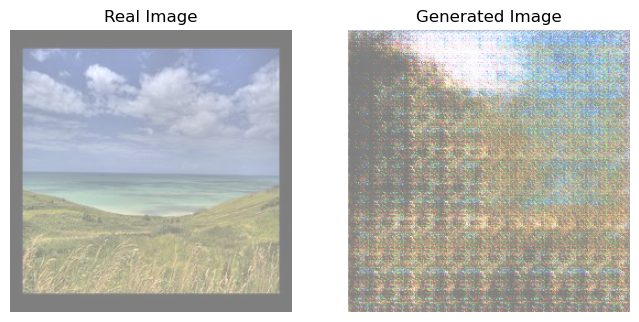

Epoch 16/150, Avg Discriminator Loss: 1.4406, Avg Generator Loss: 0.7399
D(x): 0.4913, D(G(z1))/D(G(z2)): 0.4832 / 0.4725


Epoch 17/150, Avg Discriminator Loss: 1.4288, Avg Generator Loss: 0.7355
D(x): 0.4740, D(G(z1))/D(G(z2)): 0.4752 / 0.4712


Epoch 18/150, Avg Discriminator Loss: 1.4350, Avg Generator Loss: 0.7410
D(x): 0.5031, D(G(z1))/D(G(z2)): 0.4688 / 0.4457


Epoch 19/150, Avg Discriminator Loss: 1.4262, Avg Generator Loss: 0.7337
D(x): 0.5633, D(G(z1))/D(G(z2)): 0.5104 / 0.4406


Epoch 20/150, Avg Discriminator Loss: 1.4251, Avg Generator Loss: 0.7458
D(x): 0.4274, D(G(z1))/D(G(z2)): 0.4685 / 0.4546


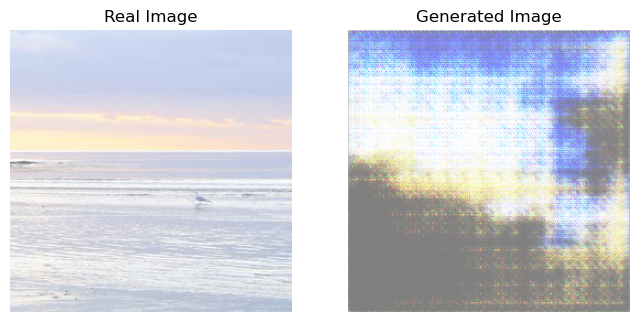

Epoch 21/150, Avg Discriminator Loss: 1.4194, Avg Generator Loss: 0.7241
D(x): 0.5075, D(G(z1))/D(G(z2)): 0.5234 / 0.4861


Epoch 22/150, Avg Discriminator Loss: 1.4194, Avg Generator Loss: 0.7285
D(x): 0.5074, D(G(z1))/D(G(z2)): 0.5292 / 0.5156


Epoch 23/150, Avg Discriminator Loss: 1.4192, Avg Generator Loss: 0.7306
D(x): 0.5212, D(G(z1))/D(G(z2)): 0.5173 / 0.4899


Epoch 24/150, Avg Discriminator Loss: 1.4243, Avg Generator Loss: 0.7208
D(x): 0.4983, D(G(z1))/D(G(z2)): 0.5134 / 0.4967


Epoch 25/150, Avg Discriminator Loss: 1.4254, Avg Generator Loss: 0.7256
D(x): 0.4639, D(G(z1))/D(G(z2)): 0.5057 / 0.4862


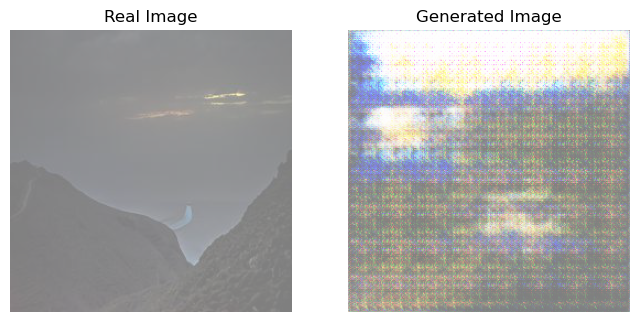

Epoch 26/150, Avg Discriminator Loss: 1.4208, Avg Generator Loss: 0.7178
D(x): 0.5080, D(G(z1))/D(G(z2)): 0.5086 / 0.4888


Epoch 27/150, Avg Discriminator Loss: 1.4252, Avg Generator Loss: 0.7344
D(x): 0.5516, D(G(z1))/D(G(z2)): 0.5432 / 0.5025


Epoch 28/150, Avg Discriminator Loss: 1.4196, Avg Generator Loss: 0.7301
D(x): 0.5230, D(G(z1))/D(G(z2)): 0.5059 / 0.4829


Epoch 29/150, Avg Discriminator Loss: 1.4128, Avg Generator Loss: 0.7336
D(x): 0.5472, D(G(z1))/D(G(z2)): 0.5304 / 0.5084


Epoch 30/150, Avg Discriminator Loss: 1.4161, Avg Generator Loss: 0.7441
D(x): 0.4973, D(G(z1))/D(G(z2)): 0.4796 / 0.4306


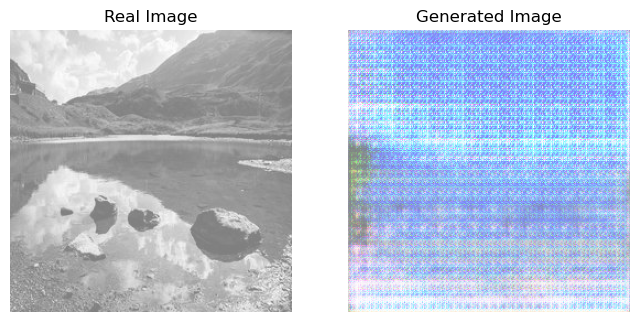

Epoch 31/150, Avg Discriminator Loss: 1.4197, Avg Generator Loss: 0.7485
D(x): 0.4577, D(G(z1))/D(G(z2)): 0.4601 / 0.4742


Epoch 32/150, Avg Discriminator Loss: 1.4135, Avg Generator Loss: 0.7572
D(x): 0.4861, D(G(z1))/D(G(z2)): 0.4542 / 0.4387


Epoch 33/150, Avg Discriminator Loss: 1.4231, Avg Generator Loss: 0.7397
D(x): 0.4445, D(G(z1))/D(G(z2)): 0.4740 / 0.4744


Epoch 34/150, Avg Discriminator Loss: 1.4278, Avg Generator Loss: 0.7279
D(x): 0.4953, D(G(z1))/D(G(z2)): 0.5236 / 0.5039


Epoch 35/150, Avg Discriminator Loss: 1.4154, Avg Generator Loss: 0.7457
D(x): 0.5291, D(G(z1))/D(G(z2)): 0.4810 / 0.4336


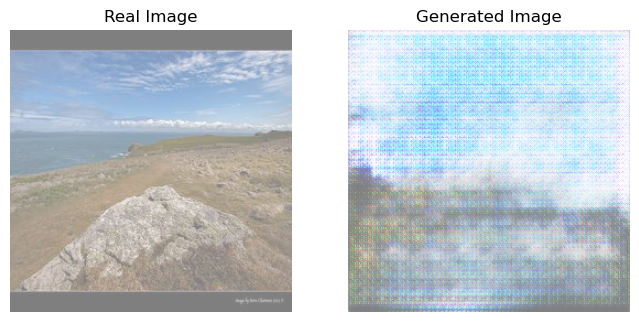

Epoch 36/150, Avg Discriminator Loss: 1.4104, Avg Generator Loss: 0.7545
D(x): 0.4670, D(G(z1))/D(G(z2)): 0.4761 / 0.4573


Epoch 37/150, Avg Discriminator Loss: 1.4226, Avg Generator Loss: 0.7316
D(x): 0.4822, D(G(z1))/D(G(z2)): 0.4889 / 0.4539


Epoch 38/150, Avg Discriminator Loss: 1.4237, Avg Generator Loss: 0.7409
D(x): 0.4891, D(G(z1))/D(G(z2)): 0.4906 / 0.4732


Epoch 39/150, Avg Discriminator Loss: 1.4250, Avg Generator Loss: 0.7470
D(x): 0.5016, D(G(z1))/D(G(z2)): 0.5095 / 0.5007


Epoch 40/150, Avg Discriminator Loss: 1.4135, Avg Generator Loss: 0.7450
D(x): 0.4992, D(G(z1))/D(G(z2)): 0.4976 / 0.4763


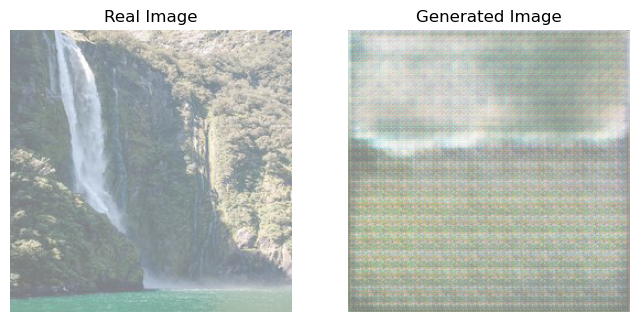

Epoch 41/150, Avg Discriminator Loss: 1.4207, Avg Generator Loss: 0.7310
D(x): 0.4989, D(G(z1))/D(G(z2)): 0.4936 / 0.4856


Epoch 42/150, Avg Discriminator Loss: 1.4191, Avg Generator Loss: 0.7385
D(x): 0.4654, D(G(z1))/D(G(z2)): 0.4582 / 0.4436


Epoch 43/150, Avg Discriminator Loss: 1.4196, Avg Generator Loss: 0.7305
D(x): 0.4602, D(G(z1))/D(G(z2)): 0.4695 / 0.4785


Epoch 44/150, Avg Discriminator Loss: 1.4187, Avg Generator Loss: 0.7337
D(x): 0.4823, D(G(z1))/D(G(z2)): 0.5017 / 0.4671


Epoch 45/150, Avg Discriminator Loss: 1.4156, Avg Generator Loss: 0.7281
D(x): 0.5065, D(G(z1))/D(G(z2)): 0.5095 / 0.4655


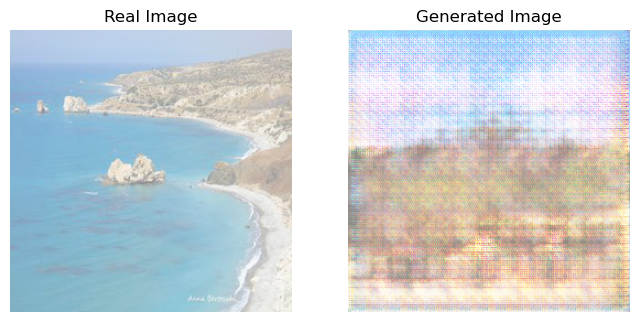

Epoch 46/150, Avg Discriminator Loss: 1.4157, Avg Generator Loss: 0.7265
D(x): 0.4847, D(G(z1))/D(G(z2)): 0.4918 / 0.4974


Epoch 47/150, Avg Discriminator Loss: 1.4165, Avg Generator Loss: 0.7277
D(x): 0.5089, D(G(z1))/D(G(z2)): 0.5120 / 0.5194


Epoch 48/150, Avg Discriminator Loss: 1.4154, Avg Generator Loss: 0.7251
D(x): 0.4702, D(G(z1))/D(G(z2)): 0.4807 / 0.4918


Epoch 49/150, Avg Discriminator Loss: 1.4204, Avg Generator Loss: 0.7225
D(x): 0.4785, D(G(z1))/D(G(z2)): 0.5125 / 0.4889


Epoch 50/150, Avg Discriminator Loss: 1.4121, Avg Generator Loss: 0.7315
D(x): 0.4935, D(G(z1))/D(G(z2)): 0.5052 / 0.4746
Generator saved at epoch 50.


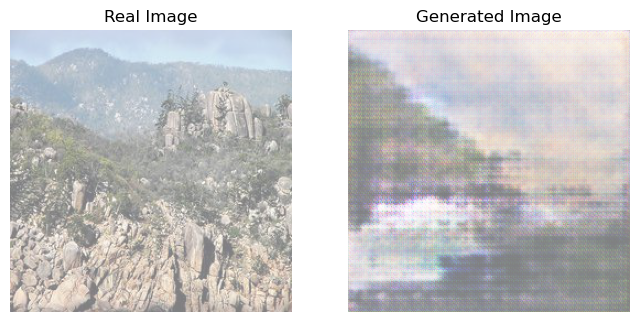

Epoch 51/150, Avg Discriminator Loss: 1.4182, Avg Generator Loss: 0.7269
D(x): 0.5059, D(G(z1))/D(G(z2)): 0.5038 / 0.4810


Epoch 52/150, Avg Discriminator Loss: 1.4169, Avg Generator Loss: 0.7235
D(x): 0.4600, D(G(z1))/D(G(z2)): 0.4917 / 0.4846


Epoch 53/150, Avg Discriminator Loss: 1.4124, Avg Generator Loss: 0.7256
D(x): 0.4709, D(G(z1))/D(G(z2)): 0.5116 / 0.4477


Epoch 54/150, Avg Discriminator Loss: 1.4137, Avg Generator Loss: 0.7354
D(x): 0.4995, D(G(z1))/D(G(z2)): 0.5036 / 0.5075


Epoch 55/150, Avg Discriminator Loss: 1.4129, Avg Generator Loss: 0.7178
D(x): 0.4622, D(G(z1))/D(G(z2)): 0.4809 / 0.4909


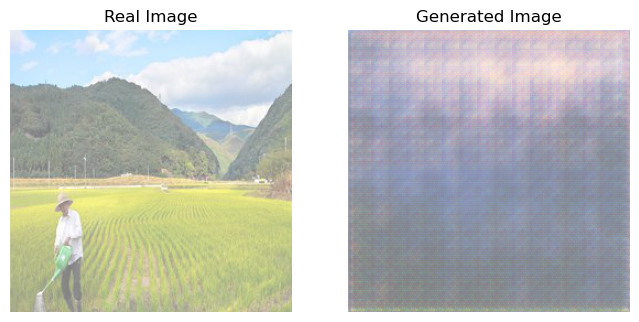

Epoch 56/150, Avg Discriminator Loss: 1.4165, Avg Generator Loss: 0.7222
D(x): 0.4672, D(G(z1))/D(G(z2)): 0.5133 / 0.4977


Epoch 57/150, Avg Discriminator Loss: 1.4126, Avg Generator Loss: 0.7369
D(x): 0.5419, D(G(z1))/D(G(z2)): 0.5345 / 0.5116


Epoch 58/150, Avg Discriminator Loss: 1.4070, Avg Generator Loss: 0.7404
D(x): 0.5274, D(G(z1))/D(G(z2)): 0.4920 / 0.4632


Epoch 59/150, Avg Discriminator Loss: 1.4117, Avg Generator Loss: 0.7241
D(x): 0.5014, D(G(z1))/D(G(z2)): 0.4824 / 0.4734


Epoch 60/150, Avg Discriminator Loss: 1.4081, Avg Generator Loss: 0.7164
D(x): 0.4578, D(G(z1))/D(G(z2)): 0.4876 / 0.5010


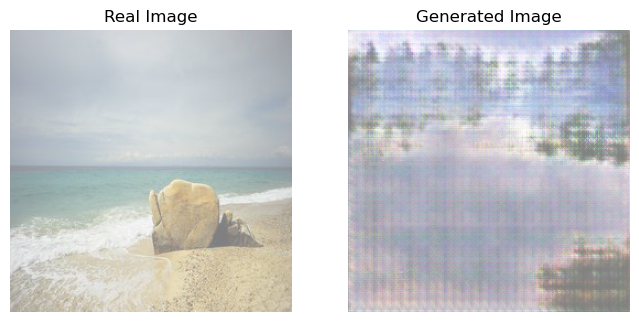

Epoch 61/150, Avg Discriminator Loss: 1.4120, Avg Generator Loss: 0.7237
D(x): 0.4845, D(G(z1))/D(G(z2)): 0.4793 / 0.4826


Epoch 62/150, Avg Discriminator Loss: 1.4138, Avg Generator Loss: 0.7217
D(x): 0.5173, D(G(z1))/D(G(z2)): 0.5344 / 0.5098


Epoch 63/150, Avg Discriminator Loss: 1.4103, Avg Generator Loss: 0.7268
D(x): 0.4906, D(G(z1))/D(G(z2)): 0.4912 / 0.4836


Epoch 64/150, Avg Discriminator Loss: 1.4094, Avg Generator Loss: 0.7327
D(x): 0.5116, D(G(z1))/D(G(z2)): 0.5252 / 0.4898


Epoch 65/150, Avg Discriminator Loss: 1.4118, Avg Generator Loss: 0.7226
D(x): 0.5509, D(G(z1))/D(G(z2)): 0.5052 / 0.4598


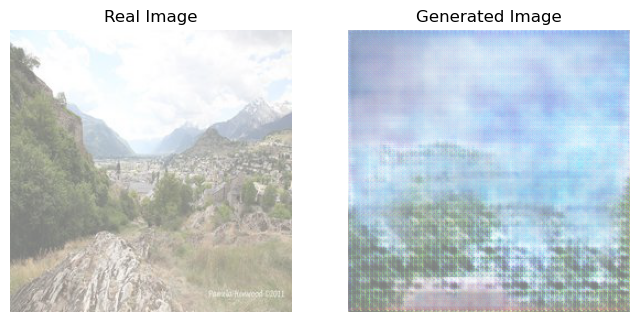

Epoch 66/150, Avg Discriminator Loss: 1.4080, Avg Generator Loss: 0.7244
D(x): 0.4549, D(G(z1))/D(G(z2)): 0.4622 / 0.4755


Epoch 67/150, Avg Discriminator Loss: 1.4073, Avg Generator Loss: 0.7223
D(x): 0.4829, D(G(z1))/D(G(z2)): 0.4901 / 0.4800


Epoch 68/150, Avg Discriminator Loss: 1.4095, Avg Generator Loss: 0.7237
D(x): 0.4991, D(G(z1))/D(G(z2)): 0.5178 / 0.5035


Epoch 69/150, Avg Discriminator Loss: 1.4049, Avg Generator Loss: 0.7383
D(x): 0.5042, D(G(z1))/D(G(z2)): 0.5329 / 0.4734


Epoch 70/150, Avg Discriminator Loss: 1.4074, Avg Generator Loss: 0.7347
D(x): 0.5211, D(G(z1))/D(G(z2)): 0.4915 / 0.4858


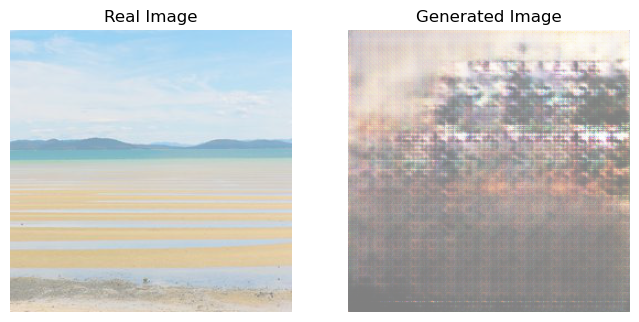

Epoch 71/150, Avg Discriminator Loss: 1.4073, Avg Generator Loss: 0.7257
D(x): 0.4730, D(G(z1))/D(G(z2)): 0.4834 / 0.4667


Epoch 72/150, Avg Discriminator Loss: 1.4053, Avg Generator Loss: 0.7337
D(x): 0.5024, D(G(z1))/D(G(z2)): 0.4825 / 0.4650


Epoch 73/150, Avg Discriminator Loss: 1.4048, Avg Generator Loss: 0.7335
D(x): 0.5008, D(G(z1))/D(G(z2)): 0.4877 / 0.4643


Epoch 74/150, Avg Discriminator Loss: 1.4060, Avg Generator Loss: 0.7322
D(x): 0.4892, D(G(z1))/D(G(z2)): 0.4980 / 0.5092


Epoch 75/150, Avg Discriminator Loss: 1.4049, Avg Generator Loss: 0.7259
D(x): 0.5130, D(G(z1))/D(G(z2)): 0.4971 / 0.4871


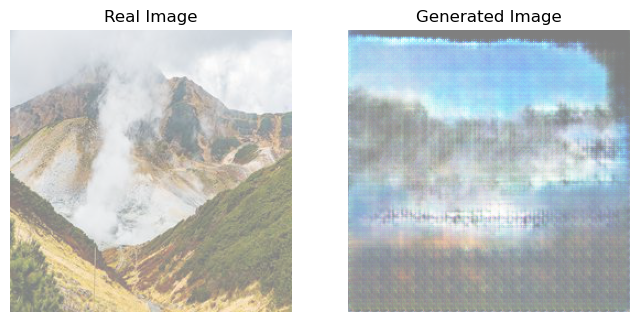

Epoch 76/150, Avg Discriminator Loss: 1.4023, Avg Generator Loss: 0.7348
D(x): 0.5545, D(G(z1))/D(G(z2)): 0.5736 / 0.5172


Epoch 77/150, Avg Discriminator Loss: 1.4031, Avg Generator Loss: 0.7310
D(x): 0.4888, D(G(z1))/D(G(z2)): 0.4909 / 0.4884


Epoch 78/150, Avg Discriminator Loss: 1.4060, Avg Generator Loss: 0.7268
D(x): 0.5001, D(G(z1))/D(G(z2)): 0.5040 / 0.4956


Epoch 79/150, Avg Discriminator Loss: 1.4012, Avg Generator Loss: 0.7325
D(x): 0.5005, D(G(z1))/D(G(z2)): 0.5214 / 0.4876


Epoch 80/150, Avg Discriminator Loss: 1.4025, Avg Generator Loss: 0.7268
D(x): 0.5102, D(G(z1))/D(G(z2)): 0.5298 / 0.5154


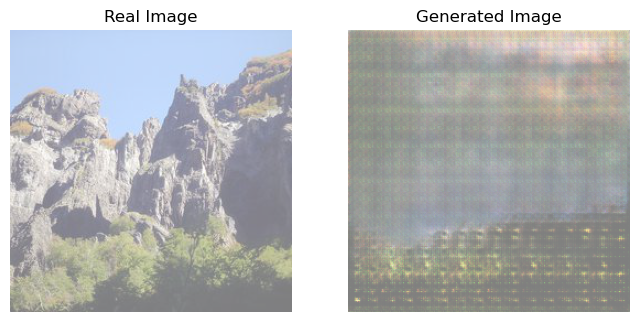

Epoch 81/150, Avg Discriminator Loss: 1.4011, Avg Generator Loss: 0.7327
D(x): 0.4760, D(G(z1))/D(G(z2)): 0.4789 / 0.4622


Epoch 82/150, Avg Discriminator Loss: 1.4006, Avg Generator Loss: 0.7293
D(x): 0.5095, D(G(z1))/D(G(z2)): 0.4852 / 0.4671


Epoch 83/150, Avg Discriminator Loss: 1.3962, Avg Generator Loss: 0.7405
D(x): 0.5159, D(G(z1))/D(G(z2)): 0.5022 / 0.4820


Epoch 84/150, Avg Discriminator Loss: 1.4009, Avg Generator Loss: 0.7375
D(x): 0.4749, D(G(z1))/D(G(z2)): 0.4733 / 0.4615


Epoch 85/150, Avg Discriminator Loss: 1.4026, Avg Generator Loss: 0.7324
D(x): 0.5158, D(G(z1))/D(G(z2)): 0.5028 / 0.4802


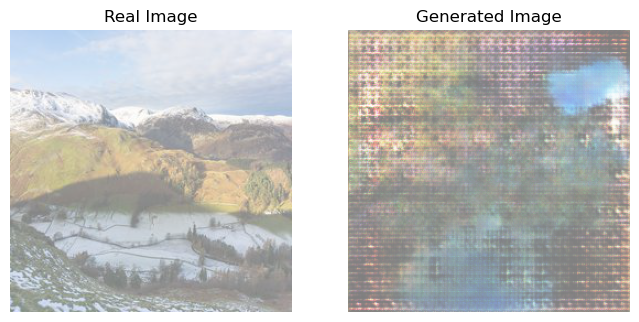

Epoch 86/150, Avg Discriminator Loss: 1.3993, Avg Generator Loss: 0.7450
D(x): 0.4877, D(G(z1))/D(G(z2)): 0.5119 / 0.4603


Epoch 87/150, Avg Discriminator Loss: 1.3997, Avg Generator Loss: 0.7298
D(x): 0.5527, D(G(z1))/D(G(z2)): 0.5093 / 0.4815


Epoch 88/150, Avg Discriminator Loss: 1.3958, Avg Generator Loss: 0.7394
D(x): 0.5274, D(G(z1))/D(G(z2)): 0.5173 / 0.4969


Epoch 89/150, Avg Discriminator Loss: 1.3934, Avg Generator Loss: 0.7405
D(x): 0.5139, D(G(z1))/D(G(z2)): 0.5277 / 0.4993


Epoch 90/150, Avg Discriminator Loss: 1.3975, Avg Generator Loss: 0.7436
D(x): 0.4690, D(G(z1))/D(G(z2)): 0.4774 / 0.4557


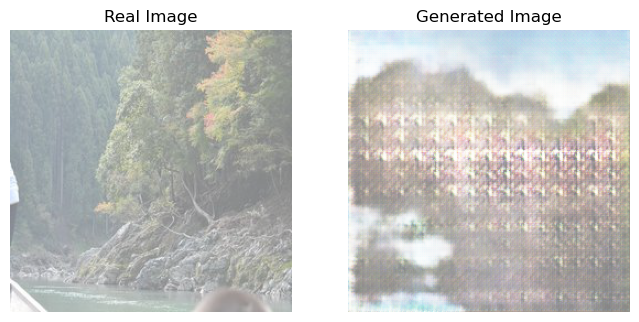

Epoch 91/150, Avg Discriminator Loss: 1.4020, Avg Generator Loss: 0.7313
D(x): 0.5295, D(G(z1))/D(G(z2)): 0.4982 / 0.4704


Epoch 92/150, Avg Discriminator Loss: 1.3959, Avg Generator Loss: 0.7391
D(x): 0.4954, D(G(z1))/D(G(z2)): 0.4971 / 0.4710


Epoch 93/150, Avg Discriminator Loss: 1.3948, Avg Generator Loss: 0.7385
D(x): 0.5143, D(G(z1))/D(G(z2)): 0.5339 / 0.5187


Epoch 94/150, Avg Discriminator Loss: 1.3964, Avg Generator Loss: 0.7400
D(x): 0.5010, D(G(z1))/D(G(z2)): 0.5121 / 0.4862


Epoch 95/150, Avg Discriminator Loss: 1.3947, Avg Generator Loss: 0.7406
D(x): 0.4848, D(G(z1))/D(G(z2)): 0.5074 / 0.4582


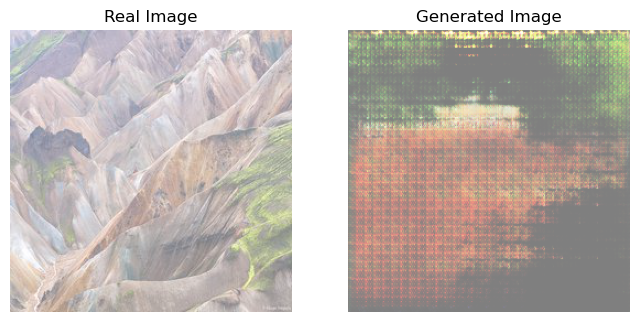

Epoch 96/150, Avg Discriminator Loss: 1.3934, Avg Generator Loss: 0.7395
D(x): 0.4494, D(G(z1))/D(G(z2)): 0.5022 / 0.5357


Epoch 97/150, Avg Discriminator Loss: 1.3933, Avg Generator Loss: 0.7372
D(x): 0.5398, D(G(z1))/D(G(z2)): 0.4968 / 0.4722


Epoch 98/150, Avg Discriminator Loss: 1.3935, Avg Generator Loss: 0.7463
D(x): 0.5017, D(G(z1))/D(G(z2)): 0.5269 / 0.4889


Epoch 99/150, Avg Discriminator Loss: 1.3882, Avg Generator Loss: 0.7457
D(x): 0.5203, D(G(z1))/D(G(z2)): 0.5392 / 0.4991


Epoch 100/150, Avg Discriminator Loss: 1.3833, Avg Generator Loss: 0.7640
D(x): 0.5177, D(G(z1))/D(G(z2)): 0.4991 / 0.4515
Generator saved at epoch 100.


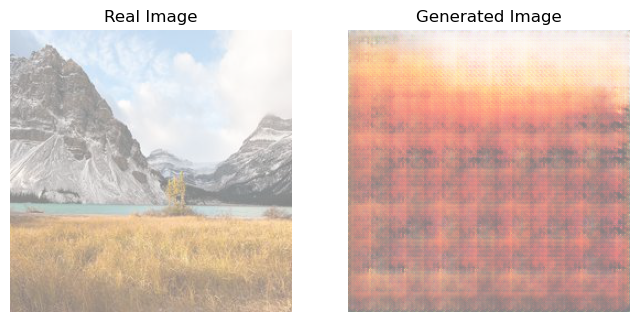

Epoch 101/150, Avg Discriminator Loss: 1.3881, Avg Generator Loss: 0.7520
D(x): 0.5037, D(G(z1))/D(G(z2)): 0.5227 / 0.4787


Epoch 102/150, Avg Discriminator Loss: 1.3870, Avg Generator Loss: 0.7445
D(x): 0.5006, D(G(z1))/D(G(z2)): 0.4911 / 0.4648


Epoch 103/150, Avg Discriminator Loss: 1.3852, Avg Generator Loss: 0.7537
D(x): 0.5006, D(G(z1))/D(G(z2)): 0.5010 / 0.4844


Epoch 104/150, Avg Discriminator Loss: 1.3887, Avg Generator Loss: 0.7491
D(x): 0.4706, D(G(z1))/D(G(z2)): 0.4559 / 0.4477


Epoch 105/150, Avg Discriminator Loss: 1.3823, Avg Generator Loss: 0.7578
D(x): 0.5081, D(G(z1))/D(G(z2)): 0.4980 / 0.4635


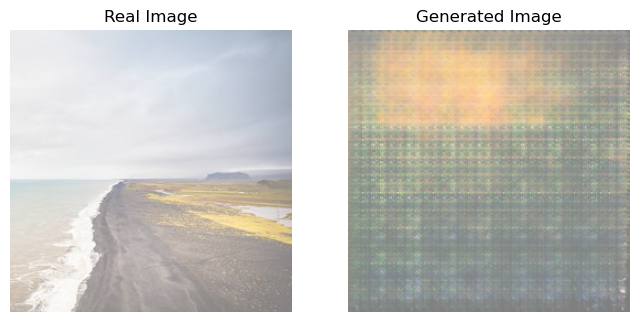

Epoch 106/150, Avg Discriminator Loss: 1.3844, Avg Generator Loss: 0.7575
D(x): 0.4854, D(G(z1))/D(G(z2)): 0.4748 / 0.4452


Epoch 107/150, Avg Discriminator Loss: 1.3831, Avg Generator Loss: 0.7491
D(x): 0.4735, D(G(z1))/D(G(z2)): 0.4528 / 0.4555


Epoch 108/150, Avg Discriminator Loss: 1.3842, Avg Generator Loss: 0.7578
D(x): 0.5051, D(G(z1))/D(G(z2)): 0.4813 / 0.4697


Epoch 109/150, Avg Discriminator Loss: 1.3711, Avg Generator Loss: 0.7676
D(x): 0.4957, D(G(z1))/D(G(z2)): 0.4846 / 0.4700


Epoch 110/150, Avg Discriminator Loss: 1.3787, Avg Generator Loss: 0.7635
D(x): 0.5193, D(G(z1))/D(G(z2)): 0.4752 / 0.4524


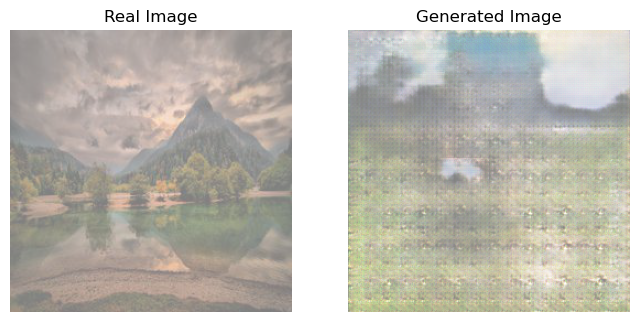

Epoch 111/150, Avg Discriminator Loss: 1.3755, Avg Generator Loss: 0.7707
D(x): 0.5475, D(G(z1))/D(G(z2)): 0.5195 / 0.4935


Epoch 112/150, Avg Discriminator Loss: 1.3726, Avg Generator Loss: 0.7759
D(x): 0.5183, D(G(z1))/D(G(z2)): 0.4933 / 0.4522


Epoch 113/150, Avg Discriminator Loss: 1.3611, Avg Generator Loss: 0.7833
D(x): 0.4814, D(G(z1))/D(G(z2)): 0.4506 / 0.4426


Epoch 114/150, Avg Discriminator Loss: 1.3640, Avg Generator Loss: 0.7892
D(x): 0.5075, D(G(z1))/D(G(z2)): 0.4681 / 0.4636


Epoch 115/150, Avg Discriminator Loss: 1.3574, Avg Generator Loss: 0.7886
D(x): 0.4989, D(G(z1))/D(G(z2)): 0.4913 / 0.4526


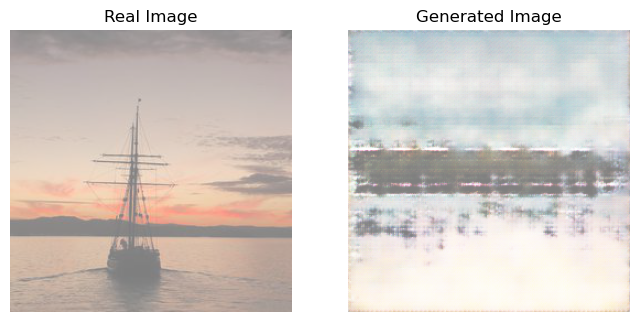

Epoch 116/150, Avg Discriminator Loss: 1.3707, Avg Generator Loss: 0.7901
D(x): 0.5284, D(G(z1))/D(G(z2)): 0.5132 / 0.4654


Epoch 117/150, Avg Discriminator Loss: 1.3642, Avg Generator Loss: 0.7839
D(x): 0.5198, D(G(z1))/D(G(z2)): 0.4854 / 0.4686


Epoch 118/150, Avg Discriminator Loss: 1.3659, Avg Generator Loss: 0.7881
D(x): 0.5321, D(G(z1))/D(G(z2)): 0.5124 / 0.4743


Epoch 119/150, Avg Discriminator Loss: 1.3634, Avg Generator Loss: 0.7950
D(x): 0.5158, D(G(z1))/D(G(z2)): 0.4926 / 0.4474


Epoch 120/150, Avg Discriminator Loss: 1.3597, Avg Generator Loss: 0.7945
D(x): 0.5344, D(G(z1))/D(G(z2)): 0.4970 / 0.4266


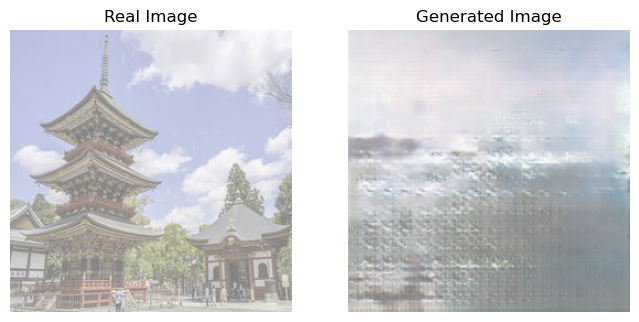

Epoch 121/150, Avg Discriminator Loss: 1.3581, Avg Generator Loss: 0.7930
D(x): 0.5395, D(G(z1))/D(G(z2)): 0.5102 / 0.4551


Epoch 122/150, Avg Discriminator Loss: 1.3490, Avg Generator Loss: 0.8002
D(x): 0.4980, D(G(z1))/D(G(z2)): 0.4804 / 0.4557


Epoch 123/150, Avg Discriminator Loss: 1.3579, Avg Generator Loss: 0.8032
D(x): 0.5424, D(G(z1))/D(G(z2)): 0.4443 / 0.4286


Epoch 124/150, Avg Discriminator Loss: 1.3487, Avg Generator Loss: 0.8057
D(x): 0.5309, D(G(z1))/D(G(z2)): 0.4636 / 0.4336


Epoch 125/150, Avg Discriminator Loss: 1.3412, Avg Generator Loss: 0.8213
D(x): 0.4935, D(G(z1))/D(G(z2)): 0.4567 / 0.4642


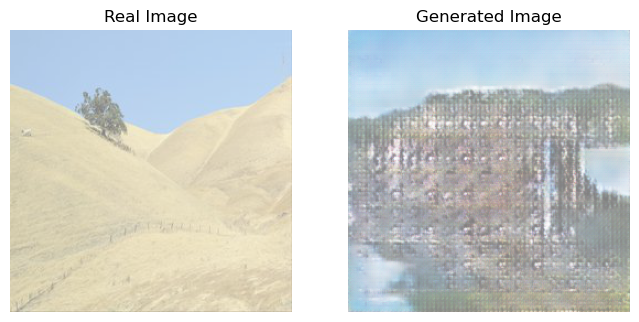

Epoch 126/150, Avg Discriminator Loss: 1.3485, Avg Generator Loss: 0.8123
D(x): 0.4499, D(G(z1))/D(G(z2)): 0.4438 / 0.4679


Epoch 127/150, Avg Discriminator Loss: 1.3429, Avg Generator Loss: 0.8242
D(x): 0.5278, D(G(z1))/D(G(z2)): 0.4962 / 0.4090


Epoch 128/150, Avg Discriminator Loss: 1.3385, Avg Generator Loss: 0.8253
D(x): 0.6021, D(G(z1))/D(G(z2)): 0.4838 / 0.4105


Epoch 129/150, Avg Discriminator Loss: 1.3332, Avg Generator Loss: 0.8439
D(x): 0.5222, D(G(z1))/D(G(z2)): 0.5180 / 0.4716


Epoch 130/150, Avg Discriminator Loss: 1.3311, Avg Generator Loss: 0.8364
D(x): 0.5349, D(G(z1))/D(G(z2)): 0.4399 / 0.3928


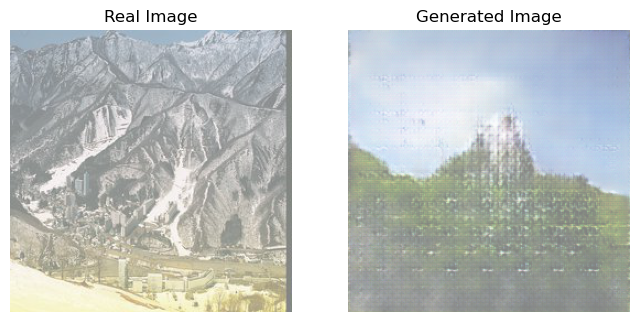

Epoch 131/150, Avg Discriminator Loss: 1.3245, Avg Generator Loss: 0.8516
D(x): 0.4713, D(G(z1))/D(G(z2)): 0.4874 / 0.4294


Epoch 132/150, Avg Discriminator Loss: 1.3229, Avg Generator Loss: 0.8419
D(x): 0.5567, D(G(z1))/D(G(z2)): 0.4503 / 0.4290


Epoch 133/150, Avg Discriminator Loss: 1.3282, Avg Generator Loss: 0.8455
D(x): 0.5680, D(G(z1))/D(G(z2)): 0.5040 / 0.4471


Epoch 134/150, Avg Discriminator Loss: 1.3331, Avg Generator Loss: 0.8354
D(x): 0.4566, D(G(z1))/D(G(z2)): 0.4778 / 0.4766


Epoch 135/150, Avg Discriminator Loss: 1.3331, Avg Generator Loss: 0.8456
D(x): 0.6008, D(G(z1))/D(G(z2)): 0.5530 / 0.4640


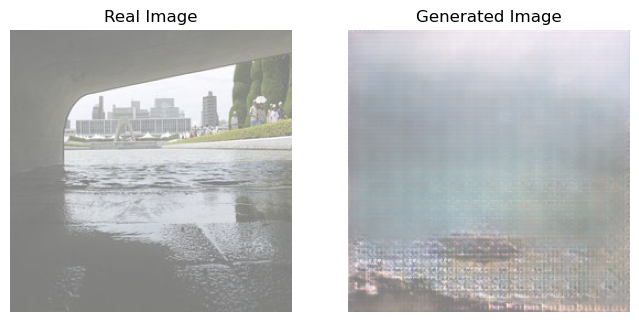

Epoch 136/150, Avg Discriminator Loss: 1.3230, Avg Generator Loss: 0.8450
D(x): 0.4963, D(G(z1))/D(G(z2)): 0.4343 / 0.4103


Epoch 137/150, Avg Discriminator Loss: 1.3142, Avg Generator Loss: 0.8626
D(x): 0.4471, D(G(z1))/D(G(z2)): 0.4144 / 0.4484


Epoch 138/150, Avg Discriminator Loss: 1.3194, Avg Generator Loss: 0.8490
D(x): 0.4557, D(G(z1))/D(G(z2)): 0.4518 / 0.4649


Epoch 139/150, Avg Discriminator Loss: 1.3206, Avg Generator Loss: 0.8640
D(x): 0.5648, D(G(z1))/D(G(z2)): 0.5122 / 0.4059


Epoch 140/150, Avg Discriminator Loss: 1.3045, Avg Generator Loss: 0.8710
D(x): 0.4605, D(G(z1))/D(G(z2)): 0.4069 / 0.4225


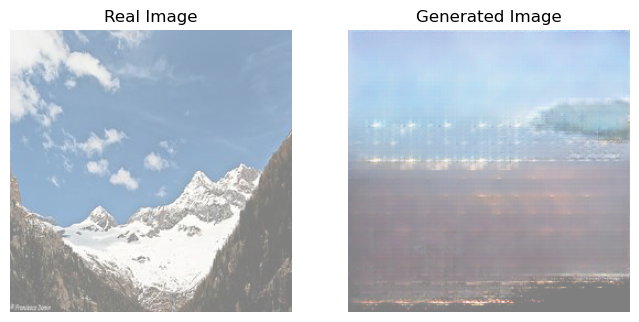

Epoch 141/150, Avg Discriminator Loss: 1.2995, Avg Generator Loss: 0.8850
D(x): 0.6082, D(G(z1))/D(G(z2)): 0.5202 / 0.4135


Epoch 142/150, Avg Discriminator Loss: 1.2956, Avg Generator Loss: 0.9013
D(x): 0.6059, D(G(z1))/D(G(z2)): 0.4280 / 0.3474


Epoch 143/150, Avg Discriminator Loss: 1.2876, Avg Generator Loss: 0.8976
D(x): 0.4744, D(G(z1))/D(G(z2)): 0.4527 / 0.4826


Epoch 144/150, Avg Discriminator Loss: 1.2828, Avg Generator Loss: 0.9008
D(x): 0.4866, D(G(z1))/D(G(z2)): 0.3860 / 0.3620


Epoch 145/150, Avg Discriminator Loss: 1.2826, Avg Generator Loss: 0.9056
D(x): 0.4968, D(G(z1))/D(G(z2)): 0.4294 / 0.3906


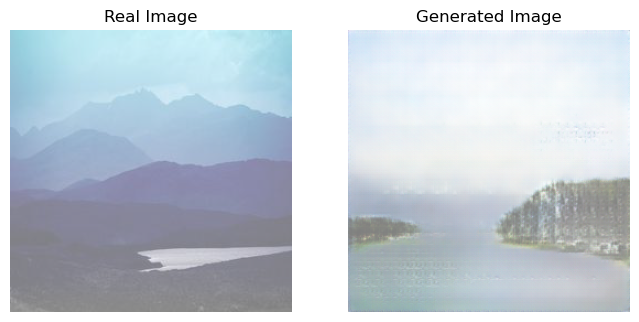

Epoch 146/150, Avg Discriminator Loss: 1.2675, Avg Generator Loss: 0.9128
D(x): 0.5833, D(G(z1))/D(G(z2)): 0.4526 / 0.3577


Epoch 147/150, Avg Discriminator Loss: 1.2742, Avg Generator Loss: 0.9376
D(x): 0.5146, D(G(z1))/D(G(z2)): 0.4075 / 0.4230


Epoch 148/150, Avg Discriminator Loss: 1.2583, Avg Generator Loss: 0.9394
D(x): 0.5716, D(G(z1))/D(G(z2)): 0.4210 / 0.3500


Epoch 149/150, Avg Discriminator Loss: 1.2588, Avg Generator Loss: 0.9392
D(x): 0.5697, D(G(z1))/D(G(z2)): 0.5310 / 0.4685


Epoch 150/150, Avg Discriminator Loss: 1.2561, Avg Generator Loss: 0.9532
D(x): 0.4076, D(G(z1))/D(G(z2)): 0.3829 / 0.4250
Generator saved at epoch 150.


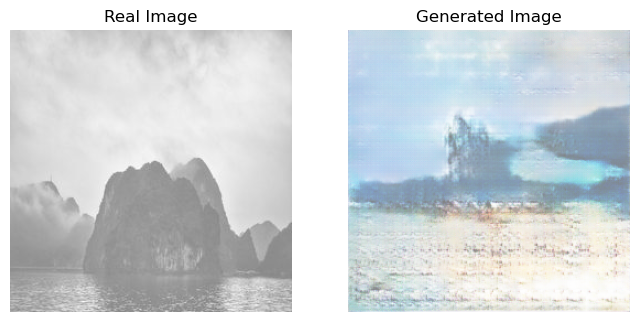

In [14]:
for epoch in range(args.epochs):
    sum_D_losses = 0.0  # Reset discriminator losses each epoch
    sum_G_losses = 0.0  # Reset generator losses each epoch
    num_batches = 0     # Reset batch count each epoch

    for i, (real_images, _) in tqdm(enumerate(dataloader), total=len(dataloader), desc="Epoch", leave=False):

        batch_size = real_images.size(0)
        real_images = real_images.to(args.device)

        # Create labels for real and fake images
        # These labels are used exclusively for calculating loss during backpropagation and are not fed into the model.
        # Real labels can be smoothed to 0.9 (instead of 1.0) as a regularization technique called label smoothing which
        # prevents the discriminator from becoming overconfident in distinguishing real images and improving training stability.
        # Fake labels are set to 0.0 to indicate fake images.
        real_labels = torch.full((batch_size,), real_label, device=args.device)  
        fake_labels = torch.full((batch_size,), fake_label, device=args.device)  
        
        # ============================
        # Train the Discriminator (D)
        # ============================
        # Clear gradients for discriminator
        d_net.zero_grad()

        # Compute discriminator loss on real images
        output_real_d = d_net(real_images).view(-1)
        d_loss_real = criterion(output_real_d, real_labels)
        d_loss_real.backward()  # Backpropagate the loss

        # Average prediction of the discriminator in real images 
        Dx = output_real_d.mean().item()

        # Generate fake images using the generator
        noise = torch.randn(batch_size, args.noise_dim, 1, 1, device=args.device)
        fake_images = g_net(noise)

        # Compute discriminator loss on fake images
        output_fake_d = d_net(fake_images.detach()).view(-1)
        d_loss_fake = criterion(output_fake_d, fake_labels)  # Use fake_labels here
        d_loss_fake.backward()

        # Average discriminator prediction for fake generated images before updating the generator.
        DG_z1 = output_fake_d.mean().item()

        # Update the discriminator's weights
        d_loss = d_loss_real + d_loss_fake
        d_optimizer.step()

        # ============================
        # Train the Generator (G)
        # ============================
        # Clear gradients for generator
        g_net.zero_grad()

        # Generator tries to fool the discriminator into believing fake images are real
        # Discriminator output for fake images
        output_fake_g = d_net(fake_images).view(-1)  
        g_loss = criterion(output_fake_g, real_labels)  
        g_loss.backward()  # Backpropagate the loss

        # Average discriminator prediction for fake generated images after updating the generator.
        DG_z2 = output_fake_g.mean().item()
        
        # Update the generator's weights
        g_optimizer.step()

        # Save losses for plotting
        sum_D_losses += d_loss.item()
        sum_G_losses += g_loss.item()
        num_batches += 1

    # Compute and store average losses for the epoch
    avg_D_loss = sum_D_losses / num_batches
    avg_G_loss = sum_G_losses / num_batches
    avg_D_losses.append(avg_D_loss)
    avg_G_losses.append(avg_G_loss)

    print(f'Epoch {epoch + 1}/{args.epochs}, Avg Discriminator Loss: {avg_D_loss:.4f}, Avg Generator Loss: {avg_G_loss:.4f}')
    print(f'D(x): {Dx:.4f}, D(G(z1))/D(G(z2)): {DG_z1:.4f} / {DG_z2:.4f}')

    # Save the model every args.save_epoch (50 in this case)
    if (epoch + 1) % args.save_epoch == 0:
        g_model_path = os.path.join(args.save_dir, f"generator_epoch_{epoch + 1}.pth")
        
        # Save only the generator model
        torch.save(g_net.state_dict(), g_model_path)
        print(f"Generator saved at epoch {epoch + 1}.")

    # Visualize real and generated images every 5 epochs
    if (epoch + 1) % 5 == 0:
        # Generate a fake image from noise
        with torch.no_grad():
            # Temporarily set the generator to evaluation mode
            g_net.eval() 
            noise = torch.randn(1, args.noise_dim, 1, 1, device=args.device) 
            fake_image = g_net(noise).detach().cpu()

            # Switch back to training mode
            g_net.train()

        # Display the real and fake images
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.title('Real Image')
        # Select a random image from the batch (pick the first one for simplicity)
        imshow(torchvision.utils.make_grid(real_images[0].to('cpu'), normalize=True))
        
        plt.subplot(1, 2, 2)
        plt.title('Generated Image')
        imshow(torchvision.utils.make_grid(fake_image, normalize=True))
        plt.show()

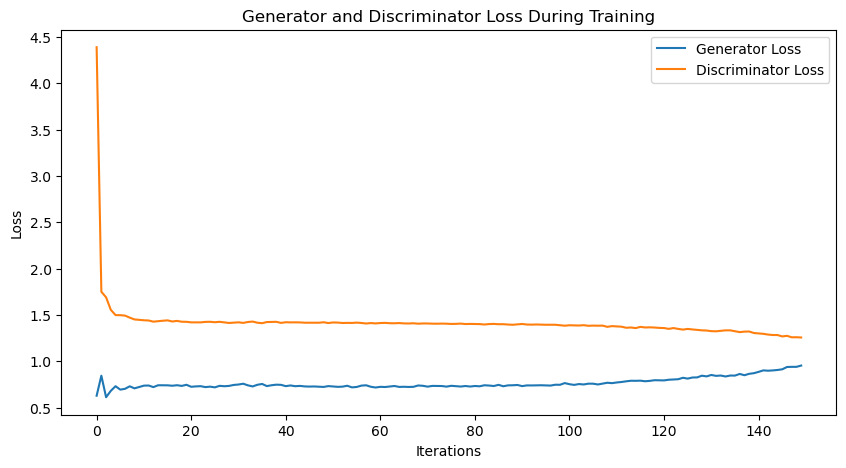

In [15]:
plot_results()

## 5. Load the Generator and Generate Images

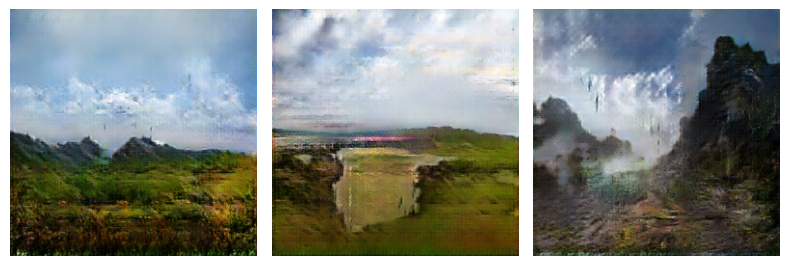

In [16]:
# Number of images to generate
num_images = 3

# Paths for loading the generator model and saving generated images
model_path = r'<path_to_your_trained_generator_model>'  
output_dir = r'<path_to_your_output_saving_directory>'
os.makedirs(output_dir, exist_ok=True) # Create the output directory if it doesn't exist

# Load the generator model and set it to evaluation mode (disable trainig-specific layers like dropouts if exist)
g_net.load_state_dict(torch.load(model_path, map_location=args.device, weights_only=False))
g_net.eval()  


with torch.no_grad():  # Disable gradient computation during image generation
    for i in range(num_images):
        # Generate random noise as input for the generator# Generate one image at a time
        noise = torch.randn(1, args.noise_dim,1 , 1, device=args.device)  
        
        # Generate a fake image and move it to the cpu for saving
        fake_image = g_net(noise)
        
        # Save the generated image to the output directory
        image_path = os.path.join(output_dir, f"generated_image_{i+1}.png")
        vutils.save_image(fake_image, image_path, normalize=True)

# Display the generated images in a horizontal stack
fig, axes = plt.subplots(1, num_images, figsize=(8, 5)) 
for i in range(num_images):
    image_path = os.path.join(output_dir, f"generated_image_{i+1}.png")
    image = plt.imread(image_path)
    axes[i].imshow(image)
    axes[i].axis('off')
plt.tight_layout()
plt.show()